In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from toolz import curry
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import MinMaxScaler

In [3]:
# Get imputed data
mimic_complete = pd.read_csv("./impute_mimic.csv")
mimic_complete.head(10)

,Unnamed: 0,id,mort_28,age,sex,weight,height,pf_ratio,po2,pco2,...,fio2,hco3,heart_rate,minute_volume,peep,plateau_pressure,respiratory_rate,syst_blood_pressure,diastolic_blood_pressure,peep_regime
0,0,32128372,0.0,75.0,0.0,93.0,168.0,241.944444,130.666667,28.111111,...,50.000000,12.000000,115.408163,8.241111,8.777778,24.333333,18.943662,100.600000,68.200000,0.0
1,1,34100191,0.0,47.0,1.0,127.0,183.0,166.356061,113.076923,34.461538,...,68.500000,12.750000,115.407407,16.628571,7.375000,17.500000,19.857143,99.000000,68.000000,0.0
2,2,38292466,0.0,85.0,1.0,77.5,170.0,224.000000,112.000000,38.000000,...,51.818182,23.000000,70.041667,9.433333,5.000000,22.333333,15.833333,102.000000,46.333333,0.0
3,3,32743332,0.0,85.0,1.0,90.7,170.0,205.714286,72.000000,38.000000,...,36.875000,27.000000,70.480000,7.478571,5.000000,24.000000,18.200000,108.083333,46.208333,0.0
4,4,35009126,1.0,64.0,1.0,70.0,183.0,173.777778,94.666667,38.666667,...,52.500000,21.666667,73.955556,7.050000,5.428571,14.328571,15.016667,103.415094,57.377358,0.0
5,5,38740124,0.0,38.0,1.0,84.1,178.0,345.000000,199.000000,44.000000,...,60.000000,25.500000,102.909091,7.725000,5.750000,18.275128,16.230769,126.181818,78.909091,0.0
6,6,32359580,1.0,69.0,1.0,86.2,185.0,354.723810,213.500000,32.000000,...,66.250000,9.888889,93.500000,10.500000,8.333333,25.500000,23.852941,91.000000,56.363636,0.0
7,7,39880770,0.0,28.0,0.0,120.0,170.0,770.000000,308.000000,35.000000,...,51.111111,25.000000,95.193548,7.842857,5.625000,15.000000,19.526316,112.620690,51.206897,0.0
8,8,37153661,1.0,82.0,0.0,46.3,157.0,140.071429,109.000000,36.000000,...,60.000000,17.500000,96.090909,7.962500,6.250000,19.000000,21.292683,100.000000,46.235294,0.0
9,9,33630048,0.0,70.0,0.0,63.7,157.0,310.000000,126.000000,29.666667,...,50.000000,16.000000,70.720000,6.516667,5.000000,16.500000,16.451613,100.705882,54.470588,0.0


In [4]:
# Create variables to store outcome Y, treatment T, and features X
y = "mort_28"
T = "peep_regime"
L = ["age", "weight", "pf_ratio", "po2", "driving_pressure", "fio2", "hco3", "plateau_pressure", "respiratory_rate"] 
X = ["age", "sex", "weight", "height", "pf_ratio", "po2", "pco2", "ph", "driving_pressure", "lung_compliance", "map", "bilirubin", "creatinine", "platelets", "urea", "fio2", "hco3", "heart_rate", "minute_volume", "peep", "plateau_pressure", "respiratory_rate", "syst_blood_pressure", "diastolic_blood_pressure"] 

In [5]:
from sklearn.metrics import auc


# Function to calculate the elasticity 
@curry
def elast(data, y, t):
    numerator = np.sum((data[t] - data[t].mean())*(data[y] - data[y].mean())) 
    denominator = np.sum((data[t] - data[t].mean())**2)
    epsilon = 1e-10
    return numerator/ (denominator + epsilon)    

# Function to calculate the cumulative gain
def cumulative_gain(dataset, prediction, y, t, min_periods=30, steps=100):
    size = dataset.shape[0]
    ordered_df = dataset.sort_values(prediction, ascending=False).reset_index(drop=True)
    print(ordered_df)
    n_rows = list(range(min_periods, size, size // steps)) + [size]
    cumulative_gains = np.array([elast(ordered_df.head(rows), y, t) * (rows/size) for rows in n_rows])
    baseline_gains = np.linspace(0, elast(dataset, y, t), len(cumulative_gains))
    cumulative_auc = auc(np.arange(len(cumulative_gains)), cumulative_gains)
    baseline_auc = auc(np.arange(len(baseline_gains)), baseline_gains)
    auc_score = cumulative_auc - baseline_auc
    # auc_score = auc(range(1, len(cumulative_gains)+1), cumulative_gains)
    return cumulative_gains, auc_score

### 1. LGBM Regressor

In [5]:
from Simulation.X_learner_confounder import X_learner_lgbm
from Simulation.T_learner import T_learner_lgbm
from Simulation.S_learner import S_learner_lgbm

gain_curve_test_s_lgbm_list, gain_curve_train_s_lgbm_list = [], []
gain_curve_test_t_lgbm_list, gain_curve_train_t_lgbm_list = [], []
gain_curve_test_x_lgbm_list, gain_curve_train_x_lgbm_list = [], []
auc_test_s_lgbm_list, auc_train_s_lgbm_list = [],[]
auc_test_t_lgbm_list, auc_train_t_lgbm_list = [],[]
auc_test_x_lgbm_list, auc_train_x_lgbm_list = [],[]
elast_test_list = []

for _ in range(100):
    # Train and test set
    train, test = train_test_split(mimic_complete, test_size=0.3, random_state=None)
    
    # Normalizing Data
    normalizer = MinMaxScaler()
    train[X] = normalizer.fit_transform(train[X])
    test[X] = normalizer.fit_transform(test[X])
    
    # Get CATE estimates for S-, T-, and X-learner using LGBM
    s_cate_train, s_cate_test = S_learner_lgbm(train, test, L, T, y)
    t_cate_train, t_cate_test = T_learner_lgbm(train, test, L, T, y)
    x_cate_train, x_cate_test = X_learner_lgbm(train, test, L, X, T, y)
    
    # Plot cumulative gain curve for meta-learners (LGBM)
    gain_curve_test_s_lgbm, auc_test_s_lgbm = cumulative_gain(s_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_s_lgbm, auc_train_s_lgbm= cumulative_gain(s_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_test_t_lgbm, auc_test_t_lgbm = cumulative_gain(t_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_t_lgbm , auc_train_t_lgbm= cumulative_gain(t_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_test_x_lgbm, auc_test_x_lgbm = cumulative_gain(x_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_x_lgbm, auc_train_x_lgbm = cumulative_gain(x_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    elast_test = elast(test, "mort_28", "peep_regime")
    
    gain_curve_test_s_lgbm_list.append(gain_curve_test_s_lgbm)
    gain_curve_train_s_lgbm_list.append(gain_curve_train_s_lgbm)
    gain_curve_test_t_lgbm_list.append(gain_curve_test_t_lgbm)
    gain_curve_train_t_lgbm_list.append(gain_curve_train_t_lgbm)
    gain_curve_test_x_lgbm_list.append(gain_curve_test_x_lgbm)
    gain_curve_train_x_lgbm_list.append(gain_curve_train_x_lgbm)
    
    auc_test_s_lgbm_list.append(auc_test_s_lgbm)
    auc_train_s_lgbm_list.append(auc_train_s_lgbm)
    auc_test_t_lgbm_list.append(auc_test_t_lgbm)
    auc_train_t_lgbm_list.append(auc_train_t_lgbm)
    auc_test_x_lgbm_list.append(auc_test_x_lgbm)
    auc_train_x_lgbm_list.append(auc_train_x_lgbm)
    
    elast_test_list.append(elast_test)

# Compute mean cumulative gain curve and AUC across iterations
gain_curve_test_s_lgbm = np.mean(gain_curve_test_s_lgbm_list, axis=0)
gain_curve_train_s_lgbm = np.mean(gain_curve_train_s_lgbm_list, axis=0)
gain_curve_test_t_lgbm = np.mean(gain_curve_test_t_lgbm_list, axis=0)
gain_curve_train_t_lgbm = np.mean(gain_curve_train_t_lgbm_list, axis=0)
gain_curve_test_x_lgbm = np.mean(gain_curve_test_x_lgbm_list, axis=0)
gain_curve_train_x_lgbm = np.mean(gain_curve_train_x_lgbm_list, axis=0)

# Get mean AUC for each learner (test + train)
auc_test_s_lgbm = np.mean(auc_test_s_lgbm_list)
auc_train_s_lgbm = np.mean(auc_train_s_lgbm_list)
auc_test_t_lgbm = np.mean(auc_test_t_lgbm_list)
auc_train_t_lgbm = np.mean(auc_train_t_lgbm_list)
auc_test_x_lgbm = np.mean(auc_test_x_lgbm_list)
auc_train_x_lgbm = np.mean(auc_train_x_lgbm_list)

# Get std AUC for each learner (test + train)
auc_test_s_lgbm_std = np.std(auc_test_s_lgbm_list)
auc_train_s_lgbm_std = np.std(auc_train_s_lgbm_list)
auc_test_t_lgbm_std = np.std(auc_test_t_lgbm_list)
auc_train_t_lgbm_std = np.std(auc_train_t_lgbm_list)
auc_test_x_lgbm_std = np.std(auc_test_x_lgbm_list)
auc_train_x_lgbm_std = np.std(auc_train_x_lgbm_list)

# Get highest AUC for each learner (test+train)
auc_test_s_lgbm_max = np.max(auc_test_s_lgbm_list)
auc_train_s_lgbm_max = np.max(auc_train_s_lgbm_list)
auc_test_t_lgbm_max = np.max(auc_test_t_lgbm_list)
auc_train_t_lgbm_max = np.max(auc_train_t_lgbm_list)
auc_test_x_lgbm_max = np.max(auc_test_x_lgbm_list)
auc_train_x_lgbm_max = np.max(auc_train_x_lgbm_list)

elast_test = np.mean(elast_test_list, axis=0)

[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=2 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Warning] min_data_in_leaf is set=20, min_child_samples=2 will be ignored. Current value: min_data_in_leaf=20
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000338 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2059
[LightGBM] [Info] Number of data points in the train set: 2758, number of used features: 10
[LightGBM] [Info] Start training from score 0.281001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

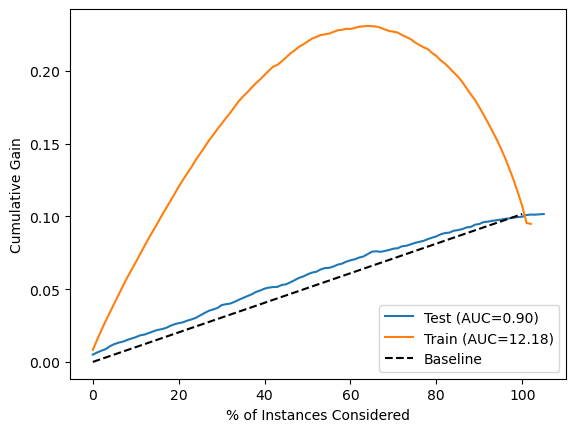

In [6]:
# Plot (averaged) cumulative gain curve S-learner (LGBM)
plt.plot(gain_curve_test_s_lgbm, color="C0", label=f"Test (AUC={auc_test_s_lgbm:.2f})")
plt.plot(gain_curve_train_s_lgbm, color="C1", label=f"Train (AUC={auc_train_s_lgbm:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()

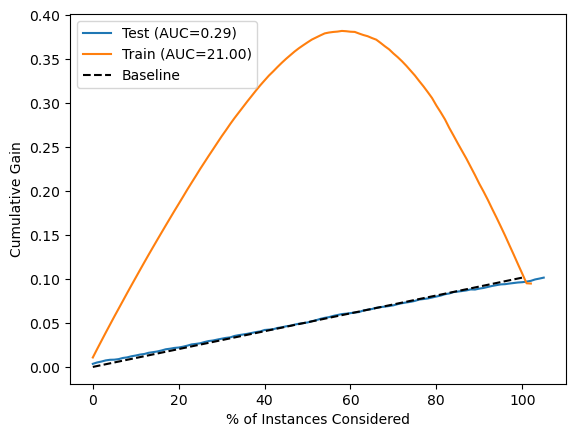

In [7]:
# Plot (averaged) cumulative gain curve T-learner (LGBM)
plt.plot(gain_curve_test_t_lgbm, color="C0", label=f"Test (AUC={auc_test_t_lgbm:.2f})")
plt.plot(gain_curve_train_t_lgbm, color="C1", label=f"Train (AUC={auc_train_t_lgbm:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()

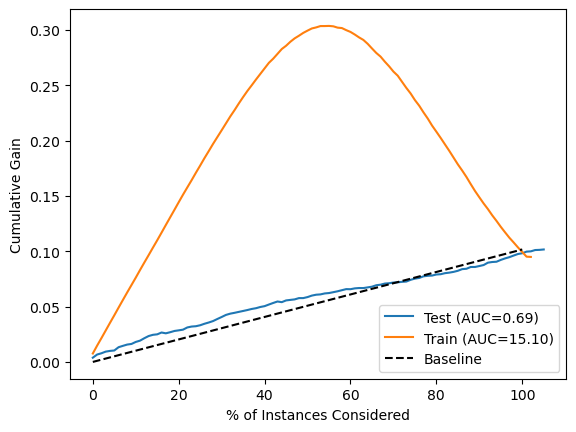

In [8]:
# Plot (averaged) cumulative gain curve T-learner (LGBM)
plt.plot(gain_curve_test_x_lgbm, color="C0", label=f"Test (AUC={auc_test_x_lgbm:.2f})")
plt.plot(gain_curve_train_x_lgbm, color="C1", label=f"Train (AUC={auc_train_x_lgbm:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()

In [9]:
# Results (table format)
print('LGBM')

print('S-learner, mean AUC, std, max test set: ', auc_test_s_lgbm, auc_test_s_lgbm_std, auc_test_s_lgbm_max)
print('S-learner, mean AUC, std, max train set: ', auc_train_s_lgbm, auc_train_s_lgbm_std, auc_train_s_lgbm_max)

print('T-learner, mean AUC, std, max test set: ', auc_test_t_lgbm, auc_test_t_lgbm_std, auc_test_t_lgbm_max)
print('T-learner, mean AUC, std, max train set: ', auc_train_t_lgbm, auc_train_t_lgbm_std, auc_train_t_lgbm_max)

print('X-learner, mean AUC, std, max test set: ', auc_test_x_lgbm, auc_test_x_lgbm_std, auc_test_x_lgbm_max)
print('X-learner, mean AUC, std, max train set: ', auc_train_x_lgbm, auc_train_x_lgbm_std, auc_train_x_lgbm_max)

LGBM
S-learner, mean AUC, std, max test set:  0.9046297844394138 1.4871402301022312 4.168813141398228
S-learner, mean AUC, std, max train set:  12.180071960679193 1.6514615693611452 16.071973947155268
T-learner, mean AUC, std, max test set:  0.2872868192517549 1.1903199291235076 3.6457295883734453
T-learner, mean AUC, std, max train set:  21.00369161068079 1.1336045790227336 23.42176607640276
X-learner, mean AUC, std, max test set:  0.6878364538911189 1.3787521063916248 4.282530732518308
X-learner, mean AUC, std, max train set:  15.100078903403405 1.298852329888088 18.18527499343274


### 2. Linear Regression

In [6]:
from Simulation.X_learner_confounder import X_learner_linear
from Simulation.T_learner import T_learner_linear
from Simulation.S_learner import S_learner_linear

gain_curve_test_s_linear_list, gain_curve_train_s_linear_list = [], []
gain_curve_test_t_linear_list, gain_curve_train_t_linear_list = [], []
gain_curve_test_x_linear_list, gain_curve_train_x_linear_list = [], []
auc_test_s_linear_list, auc_train_s_linear_list = [], []
auc_test_t_linear_list, auc_train_t_linear_list = [], []
auc_test_x_linear_list, auc_train_x_linear_list = [], []
elast_test_list = []

for _ in range(100):
    # Train and test set
    train, test = train_test_split(mimic_complete, test_size=0.3, random_state=None)
    
    # Normalizing Data
    normalizer = MinMaxScaler()
    train[X] = normalizer.fit_transform(train[X])
    test[X] = normalizer.fit_transform(test[X])
    
    # Get CATE estimates for S-, T-, and X-learner using linear
    s_cate_train, s_cate_test = S_learner_linear(train, test, L, T, y)
    t_cate_train, t_cate_test = T_learner_linear(train, test, L, T, y)
    x_cate_train, x_cate_test = X_learner_linear(train, test, L, X, T, y)
    
    # Cumulative gain curve for meta-learners (Linear)
    gain_curve_test_s_linear, auc_test_s_linear = cumulative_gain(s_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_s_linear, auc_train_s_linear = cumulative_gain(s_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_test_t_linear, auc_test_t_linear = cumulative_gain(t_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_t_linear, auc_train_t_linear = cumulative_gain(t_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_test_x_linear, auc_test_x_linear = cumulative_gain(x_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_x_linear, auc_train_x_linear = cumulative_gain(x_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    elast_test = elast(test, "mort_28", "peep_regime")
    
    gain_curve_test_s_linear_list.append(gain_curve_test_s_linear)
    gain_curve_train_s_linear_list.append(gain_curve_train_s_linear)
    gain_curve_test_t_linear_list.append(gain_curve_test_t_linear)
    gain_curve_train_t_linear_list.append(gain_curve_train_t_linear)
    gain_curve_test_x_linear_list.append(gain_curve_test_x_linear)
    gain_curve_train_x_linear_list.append(gain_curve_train_x_linear)
    
    auc_test_s_linear_list.append(auc_test_s_linear)
    auc_train_s_linear_list.append(auc_train_s_linear)
    auc_test_t_linear_list.append(auc_test_t_linear)
    auc_train_t_linear_list.append(auc_train_t_linear)
    auc_test_x_linear_list.append(auc_test_x_linear)
    auc_train_x_linear_list.append(auc_train_x_linear)
    
    elast_test_list.append(elast_test)
    
# Compute mean cumulative gain curve and AUC across iterations
gain_curve_test_s_linear = np.mean(gain_curve_test_s_linear_list, axis=0)
gain_curve_train_s_linear = np.mean(gain_curve_train_s_linear_list, axis=0)
gain_curve_test_t_linear = np.mean(gain_curve_test_t_linear_list, axis=0)
gain_curve_train_t_linear = np.mean(gain_curve_train_t_linear_list, axis=0)
gain_curve_test_x_linear= np.mean(gain_curve_test_x_linear_list, axis=0)
gain_curve_train_x_linear = np.mean(gain_curve_train_x_linear_list, axis=0)

auc_test_s_linear = np.mean(auc_test_s_linear_list)
auc_train_s_linear = np.mean(auc_train_s_linear_list)
auc_test_t_linear = np.mean(auc_test_t_linear_list)
auc_train_t_linear = np.mean(auc_train_t_linear_list)
auc_test_x_linear = np.mean(auc_test_x_linear_list)
auc_train_x_linear = np.mean(auc_train_x_linear_list)

# Get std AUC for each learner (test + train)
auc_test_s_linear_std = np.std(auc_test_s_linear_list)
auc_train_s_linear_std = np.std(auc_train_s_linear_list)
auc_test_t_linear_std = np.std(auc_test_t_linear_list)
auc_train_t_linear_std = np.std(auc_train_t_linear_list)
auc_test_x_linear_std = np.std(auc_test_x_linear_list)
auc_train_x_linear_std = np.std(auc_train_x_linear_list)

# Get highest AUC for each learner (test+train)
auc_test_s_linear_max = np.max(auc_test_s_linear_list)
auc_train_s_linear_max = np.max(auc_train_s_linear_list)
auc_test_t_linear_max = np.max(auc_test_t_linear_list)
auc_train_t_linear_max = np.max(auc_train_t_linear_list)
auc_test_x_linear_max = np.max(auc_test_x_linear_list)
auc_train_x_linear_max = np.max(auc_train_x_linear_list)

elast_test = np.mean(elast_test_list, axis=0)

[0.16538512 0.24199808 0.1895408  ... 0.26284831 0.21728122 0.15705824]
      Unnamed: 0        id  mort_28       age  sex    weight    height  \
0           3453  37270064      0.0  0.012987  0.0  0.146982  0.550725   
1           2971  37531469      0.0  0.636364  0.0  0.109111  0.362319   
2           1970  32414218      1.0  0.558442  1.0  0.255718  0.521739   
3           3703  34239158      0.0  0.961039  0.0  0.093363  0.434783   
4           2701  35648922      0.0  0.870130  1.0  0.187102  0.658943   
...          ...       ...      ...       ...  ...       ...       ...   
1178        2075  30944047      0.0  0.779221  0.0  0.223549  0.506323   
1179         912  33721773      0.0  0.883117  0.0  0.037120  0.289855   
1180        3658  36505750      1.0  0.662338  0.0  0.209599  0.515352   
1181        2058  36452873      0.0  0.688312  0.0  0.106862  0.666667   
1182        3259  35941893      1.0  0.571429  0.0  0.203600  0.521739   

      pf_ratio       po2      pco2  ...

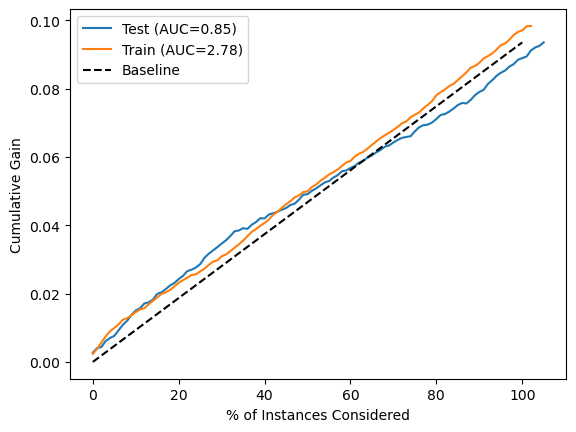

In [11]:
# S-Learner, Linear: Evaluating the model by looking at the cumulative gain curve
plt.plot(gain_curve_test_s_linear, color="C0", label=f"Test (AUC={auc_test_t_linear:.2f})")
plt.plot(gain_curve_train_s_linear, color="C1", label=f"Train (AUC={auc_train_t_linear:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()

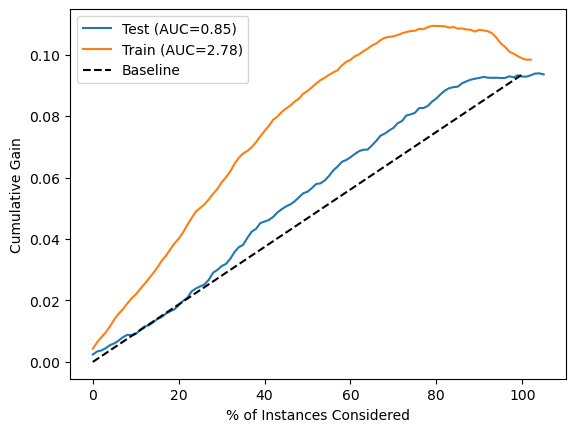

In [12]:
# T-Learner, Linear: Evaluating the model by looking at the cumulative gain curve
plt.plot(gain_curve_test_t_linear, color="C0", label=f"Test (AUC={auc_test_t_linear:.2f})")
plt.plot(gain_curve_train_t_linear, color="C1", label=f"Train (AUC={auc_train_t_linear:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()

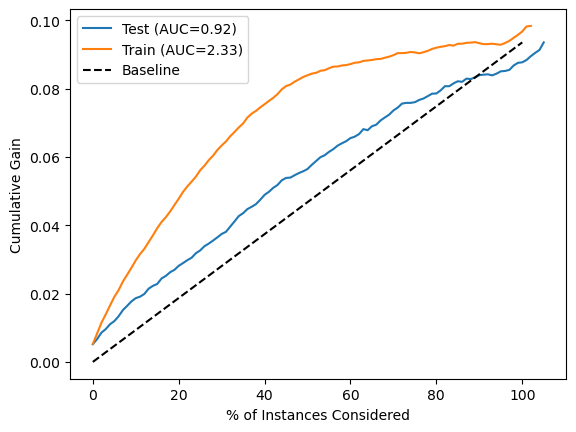

In [13]:
# X-Learner, Linear: Evaluating the model by looking at the cumulative gain curve
plt.plot(gain_curve_test_x_linear, color="C0", label=f"Test (AUC={auc_test_x_linear:.2f})")
plt.plot(gain_curve_train_x_linear, color="C1", label=f"Train (AUC={auc_train_x_linear:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()

In [14]:
# Results (table format)
print('Linear Regression')

print('S-learner, mean AUC, std, max test set: ', auc_test_s_linear, auc_test_s_linear_std, auc_test_s_linear_max)
print('S-learner, mean AUC, std, max train set: ', auc_train_s_linear, auc_train_s_linear_std, auc_train_s_linear_max)

print('T-learner, mean AUC, std, max test set: ', auc_test_t_linear, auc_test_t_linear_std, auc_test_t_linear_max)
print('T-learner, mean AUC, std, max train set: ', auc_train_t_linear, auc_train_t_linear_std, auc_train_t_linear_max)

print('X-learner, mean AUC, std, max test set: ', auc_test_x_linear, auc_test_x_linear_std, auc_test_x_linear_max)
print('X-learner, mean AUC, std, max train set: ', auc_train_x_linear, auc_train_x_linear_std, auc_train_x_linear_max)


Linear Regression
S-learner, mean AUC, std, max test set:  0.364796955483364 1.2320087558700141 3.4770572265612074
S-learner, mean AUC, std, max train set:  0.20440682030028248 0.7907969345515276 2.0005983126548825
T-learner, mean AUC, std, max test set:  0.8524948655709338 1.3139945779879398 6.14675718901211
T-learner, mean AUC, std, max train set:  2.7777170376616938 0.9752914064702717 6.124223047597364
X-learner, mean AUC, std, max test set:  0.922872748310597 1.3226040312332121 5.681142503804912
X-learner, mean AUC, std, max train set:  2.32723337519884 0.6858790276276325 4.3470672958389915


### 3. Random Forest

In [15]:
from Simulation.X_learner_confounder import X_learner_rf
from Simulation.T_learner import T_learner_rf
from Simulation.S_learner import S_learner_rf

gain_curve_test_s_rf_list, gain_curve_train_s_rf_list = [], []
gain_curve_test_t_rf_list, gain_curve_train_t_rf_list = [], []
gain_curve_test_x_rf_list, gain_curve_train_x_rf_list = [], []
auc_test_s_rf_list, auc_train_s_rf_list = [], []
auc_test_t_rf_list, auc_train_t_rf_list = [], []
auc_test_x_rf_list, auc_train_x_rf_list = [], []
elast_test_list = []

for _ in range(100):
    # Train and test set
    train, test = train_test_split(mimic_complete, test_size=0.3, random_state=None)
    
    # Normalizing Data
    normalizer = MinMaxScaler()
    train[X] = normalizer.fit_transform(train[X])
    test[X] = normalizer.fit_transform(test[X])
    
    # Get CATE estimates for S-, T-, and X-learner using RF
    s_cate_train, s_cate_test = S_learner_rf(train, test, L, T, y)
    t_cate_train, t_cate_test = T_learner_rf(train, test, L, T, y)
    x_cate_train, x_cate_test = X_learner_rf(train, test, L, X, T, y)
    
    # Calculate cumulative gain curve and AUC for meta-learners(RF)
    gain_curve_test_s_rf, auc_test_s_rf = cumulative_gain(s_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_s_rf, auc_train_s_rf = cumulative_gain(s_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_test_t_rf, auc_test_t_rf = cumulative_gain(t_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_t_rf, auc_train_t_rf = cumulative_gain(t_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_test_x_rf, auc_test_x_rf = cumulative_gain(x_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_x_rf, auc_train_x_rf = cumulative_gain(x_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    elast_test = elast(test, "mort_28", "peep_regime")
    
    gain_curve_test_s_rf_list.append(gain_curve_test_s_rf)
    gain_curve_train_s_rf_list.append(gain_curve_train_s_rf)
    gain_curve_test_t_rf_list.append(gain_curve_test_t_rf)
    gain_curve_train_t_rf_list.append(gain_curve_train_t_rf)
    gain_curve_test_x_rf_list.append(gain_curve_test_x_rf)
    gain_curve_train_x_rf_list.append(gain_curve_train_x_rf)
    
    auc_test_s_rf_list.append(auc_test_s_rf)
    auc_train_s_rf_list.append(auc_train_s_rf)
    auc_test_t_rf_list.append(auc_test_t_rf)
    auc_train_t_rf_list.append(auc_train_t_rf)
    auc_test_x_rf_list.append(auc_test_x_rf)
    auc_train_x_rf_list.append(auc_train_x_rf)

    elast_test_list.append(elast_test)
    
# Compute mean cumulative gain and AUC across iterations    
gain_curve_test_s_rf = np.mean(gain_curve_test_s_rf_list, axis=0)
gain_curve_train_s_rf = np.mean(gain_curve_train_s_rf_list, axis=0)
gain_curve_test_t_rf = np.mean(gain_curve_test_t_rf_list, axis=0)
gain_curve_train_t_rf = np.mean(gain_curve_train_t_rf_list, axis=0)
gain_curve_test_x_rf = np.mean(gain_curve_test_x_rf_list, axis=0)
gain_curve_train_x_rf = np.mean(gain_curve_train_x_rf_list, axis=0)

auc_test_s_rf = np.mean(auc_test_s_rf_list)
auc_train_s_rf = np.mean(auc_train_s_rf_list)
auc_test_t_rf = np.mean(auc_test_t_rf_list)
auc_train_t_rf = np.mean(auc_train_t_rf_list)
auc_test_x_rf = np.mean(auc_test_x_rf_list)
auc_train_x_rf = np.mean(auc_train_x_rf_list)

# Get std AUC for each learner (test + train)
auc_test_s_rf_std = np.std(auc_test_s_rf_list)
auc_train_s_rf_std = np.std(auc_train_s_rf_list)
auc_test_t_rf_std = np.std(auc_test_t_rf_list)
auc_train_t_rf_std = np.std(auc_train_t_rf_list)
auc_test_x_rf_std = np.std(auc_test_x_rf_list)
auc_train_x_rf_std = np.std(auc_train_x_rf_list)

# Get highest AUC for each learner (test + train)
auc_test_s_rf_max = np.max(auc_test_s_rf_list)
auc_train_s_rf_max = np.max(auc_train_s_rf_list)
auc_test_t_rf_max = np.max(auc_test_t_rf_list)
auc_train_t_rf_max = np.max(auc_train_t_rf_list)
auc_test_x_rf_max = np.max(auc_test_x_rf_list)
auc_train_x_rf_max = np.max(auc_train_x_rf_list)

elast_test = np.mean(elast_test_list, axis=0)

      Unnamed: 0        id  mort_28       age  sex    weight    height  \
0            684  33100316      0.0  0.441558  1.0  0.306106  0.568966   
1           2769  39709451      0.0  0.402597  0.0  0.417129  0.396552   
2           3717  35996431      0.0  0.545455  1.0  0.272403  0.431034   
3           2216  39708226      0.0  0.493506  1.0  0.261301  0.655172   
4           1736  37692530      0.0  0.259740  0.0  0.282316  0.568966   
...          ...       ...      ...       ...  ...       ...       ...   
1178        3760  30559524      0.0  0.870130  1.0  0.218874  0.482759   
1179        2886  30991625      0.0  0.857143  1.0  0.222839  0.431034   
1180        1427  31662581      0.0  0.376623  0.0  0.200238  0.431034   
1181         152  30920322      0.0  0.545455  0.0  0.147898  0.344828   
1182        1614  33253015      0.0  0.623377  0.0  0.149684  0.422599   

      pf_ratio       po2      pco2  ...      hco3  heart_rate  minute_volume  \
0     0.122994  0.210695  0.267

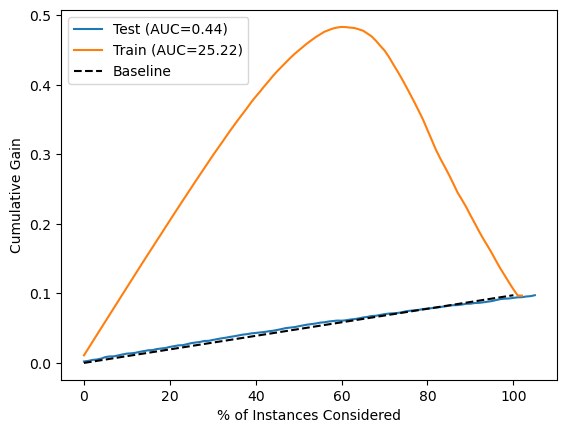

In [16]:
# S-Learner, Random Forest: Evaluating the model by looking at the cumulative gain curve
plt.plot(gain_curve_test_s_rf, color="C0", label=f"Test (AUC={auc_test_s_rf:.2f})")
plt.plot(gain_curve_train_s_rf, color="C1", label=f"Train (AUC={auc_train_s_rf:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()

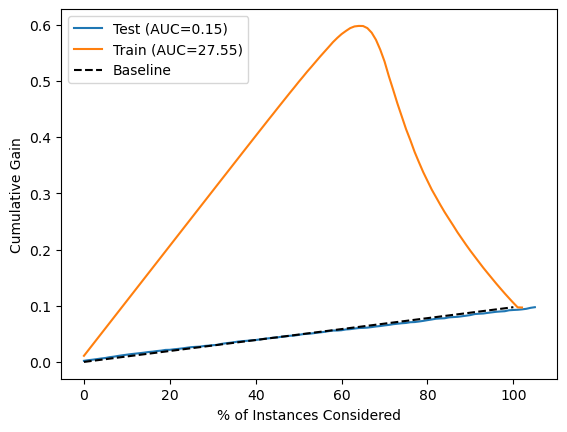

In [17]:
# T-Learner, Random Forest: Evaluating the model by looking at the cumulative gain curve
plt.plot(gain_curve_test_t_rf, color="C0", label=f"Test (AUC={auc_test_t_rf:.2f})")
plt.plot(gain_curve_train_t_rf, color="C1", label=f"Train (AUC={auc_train_t_rf:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()

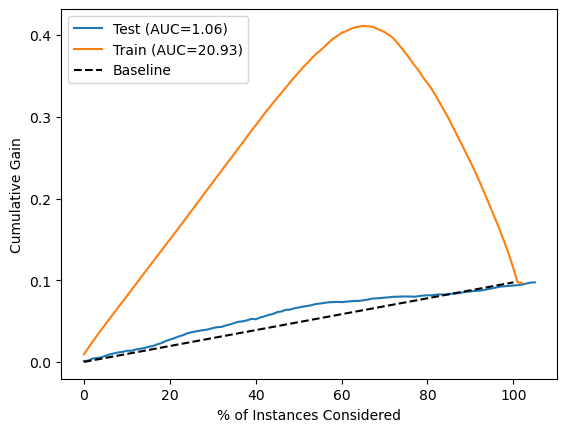

In [18]:
# X-Learner, Random Forest: Evaluating the model by looking at the cumulative gain curve
plt.plot(gain_curve_test_x_rf, color="C0", label=f"Test (AUC={auc_test_x_rf:.2f})")
plt.plot(gain_curve_train_x_rf, color="C1", label=f"Train (AUC={auc_train_x_rf:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()


In [19]:
# Results (table format)
print('Random Forest')

print('S-learner, mean AUC, std, max test set: ', auc_test_s_rf, auc_test_s_rf_std, auc_test_s_rf_max)
print('S-learner, mean AUC, std, max train set: ', auc_train_s_rf, auc_train_s_rf_std, auc_train_s_rf_max)

print('T-learner, mean AUC, std, max test set: ', auc_test_t_rf, auc_test_t_rf_std, auc_test_t_rf_max)
print('T-learner, mean AUC, std, max train set: ', auc_train_t_rf, auc_train_t_rf_std, auc_train_t_rf_max)

print('X-learner, mean AUC, std, max test set: ', auc_test_x_rf, auc_test_x_rf_std, auc_test_x_rf_max)
print('X-learner, mean AUC, std, max train set: ', auc_train_x_rf, auc_train_x_rf_std, auc_train_x_rf_max)


Random Forest
S-learner, mean AUC, std, max test set:  0.4391877154164803 1.34102480412737 3.277030558718188
S-learner, mean AUC, std, max train set:  25.223889941537795 1.1773623892664493 27.927807815186732
T-learner, mean AUC, std, max test set:  0.15079791362185926 1.2572390543727403 3.8815304099592356
T-learner, mean AUC, std, max train set:  27.54663947285151 0.40171903228584765 28.630552343141304
X-learner, mean AUC, std, max test set:  1.0587318137796935 1.75244206119893 5.4425254663615945
X-learner, mean AUC, std, max train set:  20.93467074362145 1.3569788829794005 23.695694669085086


### 4. Support Vector Regressor

In [20]:
from Simulation.X_learner_confounder import X_learner_svm
from Simulation.T_learner import T_learner_svm
from Simulation.S_learner import S_learner_svm

gain_curve_test_s_svm_list, gain_curve_train_s_svm_list = [], []
gain_curve_test_t_svm_list, gain_curve_train_t_svm_list = [], []
gain_curve_test_x_svm_list, gain_curve_train_x_svm_list = [], []
auc_test_s_svm_list, auc_train_s_svm_list = [], []
auc_test_t_svm_list, auc_train_t_svm_list = [], []
auc_test_x_svm_list, auc_train_x_svm_list = [], []
elast_test_list = []

for _ in range(100):
    # Train and test set
    train, test = train_test_split(mimic_complete, test_size=0.3, random_state=None)
    
    # Normalizing Data
    normalizer = MinMaxScaler()
    train[X] = normalizer.fit_transform(train[X])
    test[X] = normalizer.fit_transform(test[X])
    
    # Get CATE estimates for S-, T-, and X-learner using RF
    s_cate_train, s_cate_test = S_learner_svm(train, test, L, T, y)
    t_cate_train, t_cate_test = T_learner_svm(train, test, L, T, y)
    x_cate_train, x_cate_test = X_learner_svm(train, test, L, X, T, y)
    
    # Computing cumulative gain curves and AUC (SVM)
    gain_curve_test_s_svm, auc_test_s_svm = cumulative_gain(s_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_s_svm, auc_train_s_svm = cumulative_gain(s_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_test_t_svm, auc_test_t_svm = cumulative_gain(t_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_t_svm, auc_train_t_svm = cumulative_gain(t_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_test_x_svm, auc_test_x_svm = cumulative_gain(x_cate_test, "pred_cate", y="mort_28", t="peep_regime")
    gain_curve_train_x_svm, auc_train_x_svm = cumulative_gain(x_cate_train, "pred_cate", y="mort_28", t="peep_regime")
    elast_test = elast(test, "mort_28", "peep_regime")
    
    gain_curve_test_s_svm_list.append(gain_curve_test_s_svm)
    gain_curve_train_s_svm_list.append(gain_curve_train_s_svm)
    gain_curve_test_t_svm_list.append(gain_curve_test_t_svm)
    gain_curve_train_t_svm_list.append(gain_curve_train_t_svm)
    gain_curve_test_x_svm_list.append(gain_curve_test_x_svm)
    gain_curve_train_x_svm_list.append(gain_curve_train_x_svm)
    
    auc_test_s_svm_list.append(auc_test_s_svm)
    auc_train_s_svm_list.append(auc_train_s_svm)
    auc_test_t_svm_list.append(auc_test_t_svm)
    auc_train_t_svm_list.append(auc_train_t_svm)
    auc_test_x_svm_list.append(auc_test_x_svm)
    auc_train_x_svm_list.append(auc_train_x_svm)
    
    elast_test_list.append(elast_test)
    
# Compute mean cumulative gain across iterations
gain_curve_test_s_svm = np.mean(gain_curve_test_s_svm_list, axis=0)
gain_curve_train_s_svm = np.mean(gain_curve_train_s_svm_list, axis=0)
gain_curve_test_t_svm = np.mean(gain_curve_test_t_svm_list, axis=0)
gain_curve_train_t_svm = np.mean(gain_curve_train_t_svm_list, axis=0)
gain_curve_test_x_svm = np.mean(gain_curve_test_x_svm_list, axis=0)
gain_curve_train_x_svm = np.mean(gain_curve_train_x_svm_list, axis=0)

# Compute mean AUC across iterations
auc_test_s_svm = np.mean(auc_test_s_svm_list)
auc_train_s_svm = np.mean(auc_train_s_svm_list)
auc_test_t_svm = np.mean(auc_test_t_svm_list)
auc_train_t_svm = np.mean(auc_train_t_svm_list)
auc_test_x_svm = np.mean(auc_test_x_svm_list)
auc_train_x_svm = np.mean(auc_train_x_svm_list)

# Get std AUC for each learner (test + train)
auc_test_s_svm_std = np.std(auc_test_s_svm_list)
auc_train_s_svm_std = np.std(auc_train_s_svm_list)
auc_test_t_svm_std = np.std(auc_test_t_svm_list)
auc_train_t_svm_std = np.std(auc_train_t_svm_list)
auc_test_x_svm_std = np.std(auc_test_x_svm_list)
auc_train_x_svm_std = np.std(auc_train_x_svm_list)

# Get highest AUC for each learner (test + train)
auc_test_s_svm_max = np.max(auc_test_s_svm_list)
auc_train_s_svm_max = np.max(auc_train_s_svm_list)
auc_test_t_svm_max = np.max(auc_test_t_svm_list)
auc_train_t_svm_max = np.max(auc_train_t_svm_list)
auc_test_x_svm_max = np.max(auc_test_x_svm_list)
auc_train_x_svm_max = np.max(auc_train_x_svm_list)

elast_test = np.mean(elast_test_list, axis=0)

      Unnamed: 0        id  mort_28       age  sex    weight    height  \
0           2820  30694935      0.0  0.911392  1.0  0.250595  0.901515   
1           3409  38713313      0.0  0.911392  1.0  0.226842  0.840176   
2           3829  33834621      0.0  0.911392  0.0  0.103886  0.628788   
3           2986  34608866      1.0  0.835443  1.0  0.159397  0.825758   
4           1596  33879115      0.0  0.797468  1.0  0.321967  0.863636   
...          ...       ...      ...       ...  ...       ...       ...   
1178        3117  32796113      0.0  0.101266  1.0  0.167328  0.791639   
1179         724  33954078      0.0  0.164557  1.0  0.342585  0.803030   
1180        1437  34791882      0.0  0.012658  1.0  0.189929  0.825758   
1181        1211  36407893      0.0  0.088608  0.0  0.315623  0.803030   
1182         498  35628347      0.0  0.088608  0.0  0.333069  0.613636   

      pf_ratio       po2      pco2  ...      hco3  heart_rate  minute_volume  \
0     0.199775  0.424841  0.142

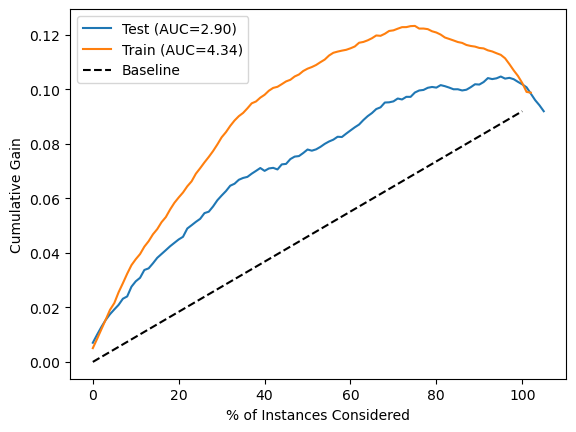

In [21]:
# S-Learner, SVM: Evaluating the model by looking at the cumulative gain curve
plt.plot(gain_curve_test_s_svm, color="C0", label=f"Test (AUC={auc_test_s_svm:.2f})")
plt.plot(gain_curve_train_s_svm, color="C1", label=f"Train (AUC={auc_train_s_svm:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()

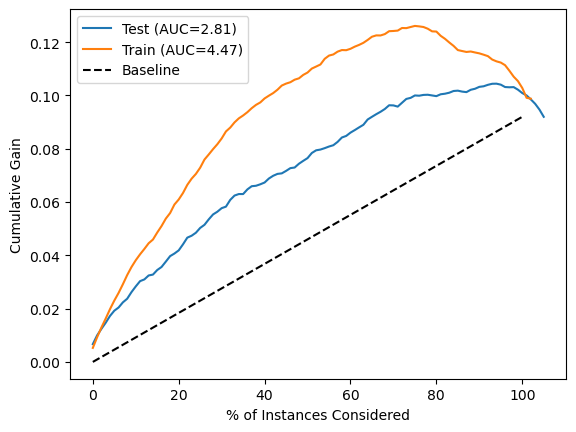

In [22]:
# T-Learner, SVM: Evaluating the model by looking at the cumulative gain curve
plt.plot(gain_curve_test_t_svm, color="C0", label=f"Test (AUC={auc_test_t_svm:.2f})")
plt.plot(gain_curve_train_t_svm, color="C1", label=f"Train (AUC={auc_train_t_svm:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()


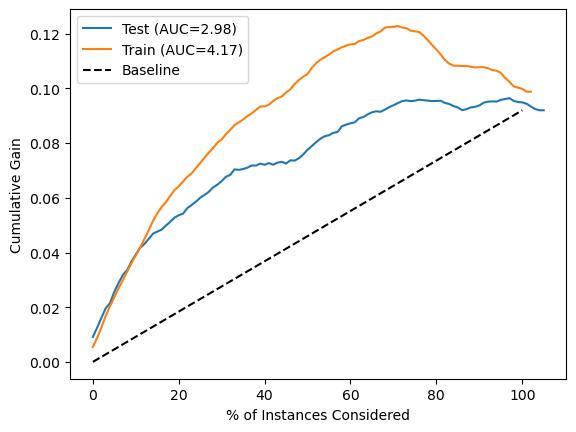

In [23]:
# X-Learner, SVM: Evaluating the model by looking at the cumulative gain curve
plt.plot(gain_curve_test_x_svm, color="C0", label=f"Test (AUC={auc_test_x_svm:.2f})")
plt.plot(gain_curve_train_x_svm, color="C1", label=f"Train (AUC={auc_train_x_svm:.2f})")
plt.plot([0, 100], [0, elast_test], linestyle="--", color="black", label="Baseline")
plt.xlabel("% of Instances Considered")
plt.ylabel("Cumulative Gain")
plt.legend()


In [24]:
# Results (table format)
print('SVM')

print('S-learner, mean AUC, std, max test set: ', auc_test_s_svm, auc_test_s_svm_std, auc_test_s_svm_max)
print('S-learner, mean AUC, std, max train set: ', auc_train_s_svm, auc_train_s_svm_std, auc_train_s_svm_max)

print('T-learner, mean AUC, std, max test set: ', auc_test_t_svm, auc_test_t_svm_std, auc_test_t_svm_max)
print('T-learner, mean AUC, std, max train set: ', auc_train_t_svm, auc_train_t_svm_std, auc_train_t_svm_max)

print('X-learner, mean AUC, std, max test set: ', auc_test_x_svm, auc_test_x_svm_std, auc_test_x_svm_max)
print('X-learner, mean AUC, std, max train set: ', auc_train_x_svm, auc_train_x_svm_std, auc_train_x_svm_max)

SVM
S-learner, mean AUC, std, max test set:  2.9020815687822994 1.6559863993595851 6.765565488598898
S-learner, mean AUC, std, max train set:  4.337285989280447 1.0204482080740134 8.637397339552434
T-learner, mean AUC, std, max test set:  2.813520119070338 1.78575248702348 8.293649581032886
T-learner, mean AUC, std, max train set:  4.4719765537309435 0.9223017383522203 7.837445501625899
X-learner, mean AUC, std, max test set:  2.976373611775177 1.4632239544020738 6.540646732425348
X-learner, mean AUC, std, max train set:  4.173617013321434 0.7753439723294685 6.501252033956247


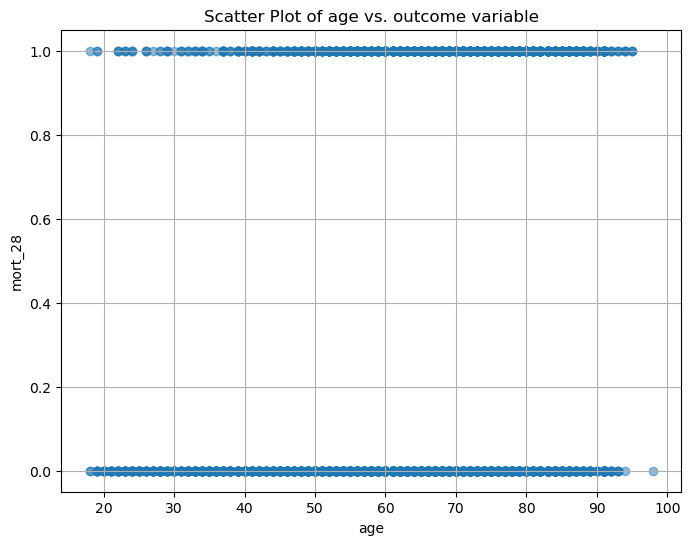

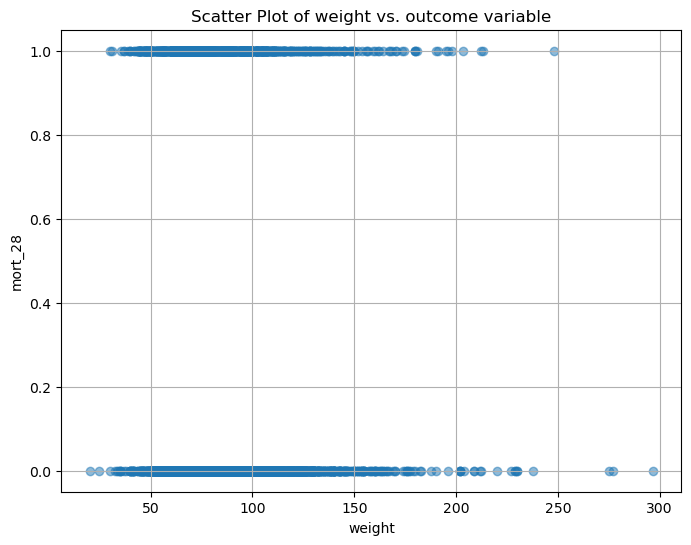

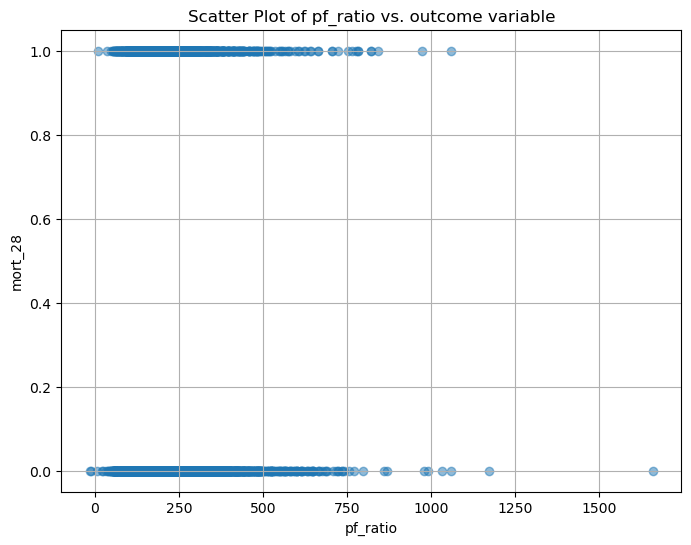

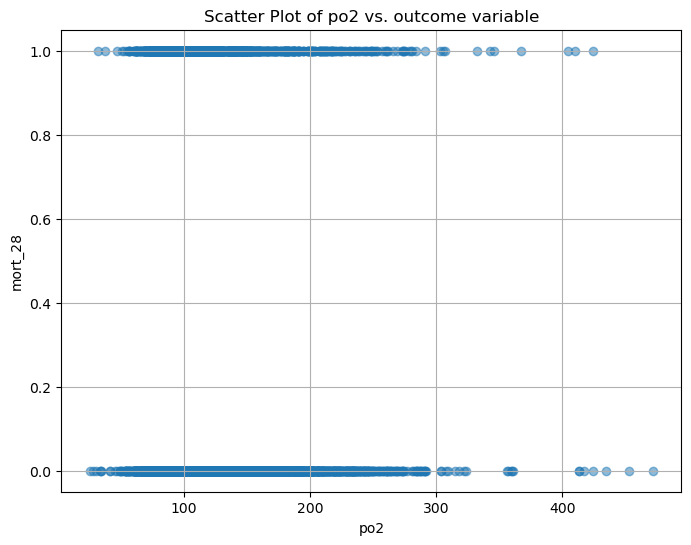

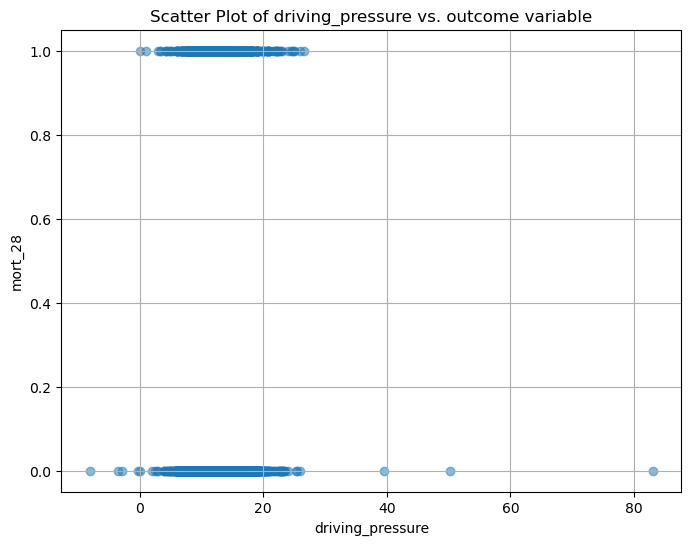

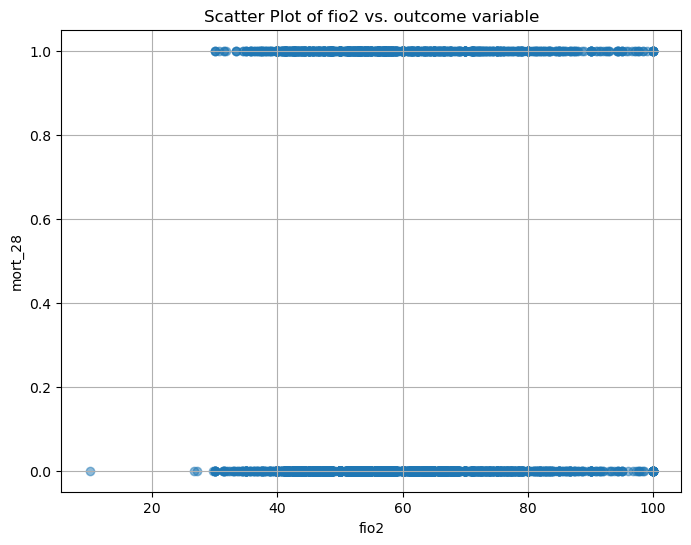

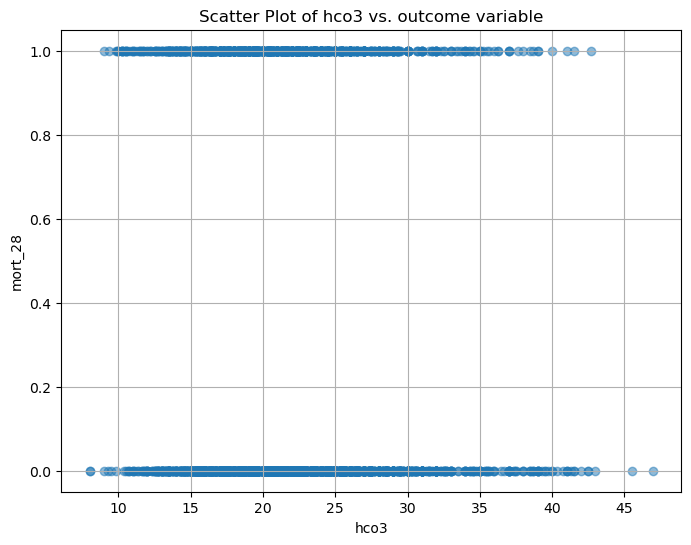

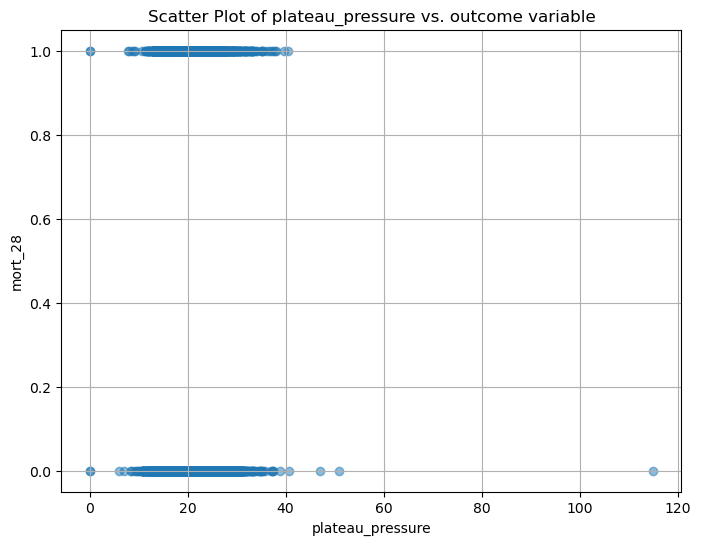

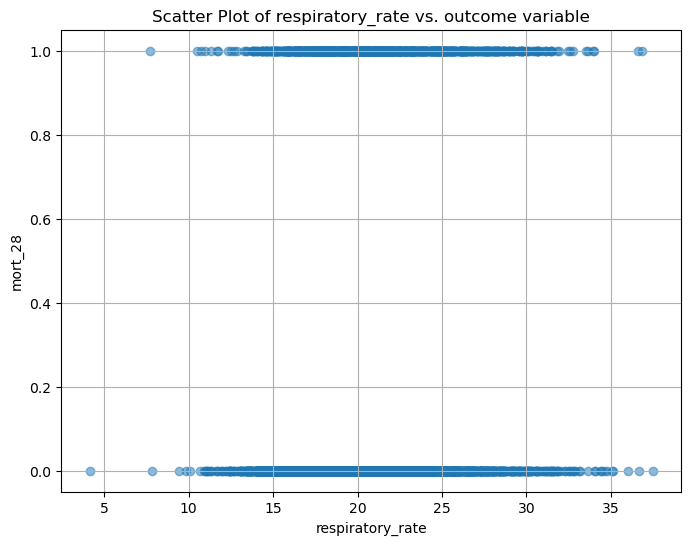

In [25]:
for feature in L:
    plt.figure(figsize=(8, 6))
    plt.scatter(mimic_complete[feature], mimic_complete[y], alpha=0.5)
    plt.xlabel(feature)
    plt.ylabel(y)
    plt.title(f'Scatter Plot of {feature} vs. outcome variable')
    plt.grid(True)
    plt.show()